In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Spider mites/TomatoSpiderMites(1).JPG
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Spider mites/TomatoSpiderMites(2).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(3).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(6).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(2).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(13).JPG
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(9).JPG
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(8).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Tomato/valid/Tomato Healthy/TomatoHealthy(1).jpg
/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
from tqdm import tqdm
import seaborn as sns 

In [4]:
DATADIR = '/kaggle/input/plantifydr-dataset/PlantDiseasesDataset/Potato/train'
CATEGORIES = ['Potato Early blight', 'Potato Late blight']
IMG_SIZE=100

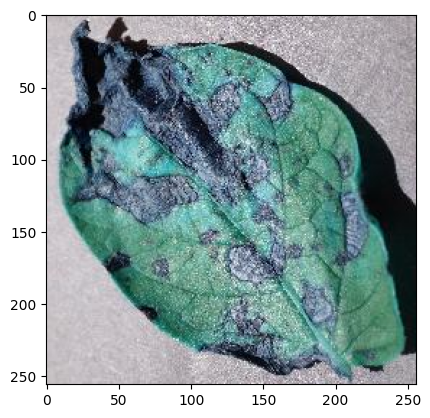

In [5]:
for category in CATEGORIES:
    path=os.path.join(DATADIR, category)
    for img in os.listdir(path):
        img_array=cv2.imread(os.path.join(path,img))
        plt.imshow(img_array)
        plt.show()
        break
    break

In [6]:
training_data=[]
def create_training_data():
    for category in CATEGORIES:
        path=os.path.join(DATADIR, category)
        class_num=CATEGORIES.index(category)
        for img in os.listdir(path):
            try:
                img_array=cv2.imread(os.path.join(path,img))
                new_array=cv2.resize(img_array,(IMG_SIZE,IMG_SIZE))
                training_data.append([new_array,class_num])
            except Exception as e:
                pass
create_training_data() 

In [7]:
print(len(training_data))

7053


In [8]:
lenofimage = len(training_data)

In [9]:
X=[]
y=[]

for categories, label in training_data:
    X.append(categories)
    y.append(label)
X= np.array(X).reshape(lenofimage,-1)

##X = tf.keras.utils.normalize(X, axis = 1)

In [10]:
X.shape

(7053, 30000)

In [12]:
X = X/255.0

In [13]:
X[1]

array([0.00232218, 0.00221453, 0.00226067, ..., 0.00276817, 0.00255286,
       0.00261438])

In [14]:
y=np.array(y)

In [15]:
y.shape

(7053,)

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [17]:
from sklearn.svm import SVC
svc = SVC(kernel='linear',gamma='auto')
svc.fit(X_train, y_train)

SVC(gamma='auto', kernel='linear')

In [18]:
y2 = svc.predict(X_test)

In [19]:
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy on unknown data is",accuracy_score(y_test,y2))

Accuracy on unknown data is 0.8928571428571429


In [20]:
from sklearn.metrics import classification_report
print("Accuracy on unknown data is",classification_report(y_test,y2))

Accuracy on unknown data is               precision    recall  f1-score   support

           0       0.91      0.88      0.90       921
           1       0.87      0.91      0.89       843

    accuracy                           0.89      1764
   macro avg       0.89      0.89      0.89      1764
weighted avg       0.89      0.89      0.89      1764



In [22]:
# Create the confusion matrix
conf_mat = confusion_matrix(y_test, y2)

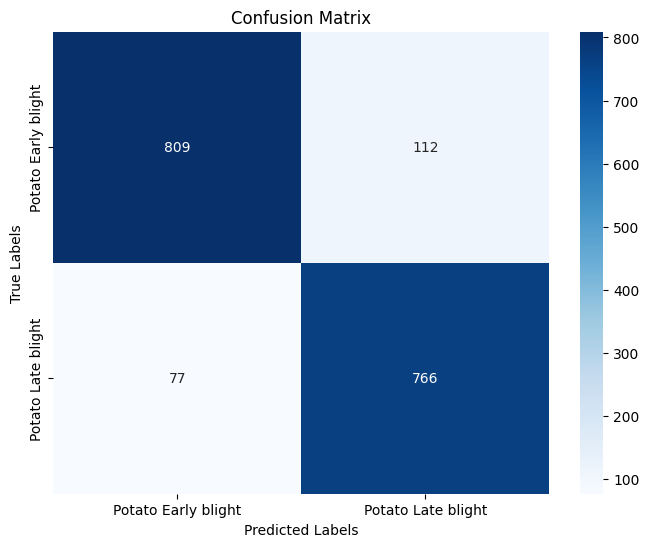

In [23]:
# Display the confusion matrix using a heatmap with annotations
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [24]:
result = pd.DataFrame({'original' : y_test,'predicted' : y2})

In [25]:
result

,original,predicted
0,0,0
1,1,1
2,1,1
3,1,1
4,0,0
...,...,...
1759,1,0
1760,0,1
1761,1,1
1762,1,1
